In [1]:
import numpy as np
import pandas as pd

from matplotlib.ticker import FuncFormatter
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline

from datetime import datetime
from numpy.random import multivariate_normal
import yfinance as yf

import scipy.stats as scs
import scipy.optimize as sco
import scipy.interpolate as sci
from scipy.stats import gaussian_kde

import statsmodels.api as sm

import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff

import seaborn as sns

#import functions as f 

import random
random.seed(1000)

In [2]:
tickers_etfs =['XLE','XLB','XLI','XLY','XLP','XLV','XLF','VGT','VOX','XLU','VNQ']
data = pd.DataFrame(columns=tickers_etfs)
data

,XLE,XLB,XLI,XLY,XLP,XLV,XLF,VGT,VOX,XLU,VNQ


In [3]:
for ticker in tickers_etfs:
    data[ticker] = yf.download(ticker, period='10y')['Adj Close']

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


In [4]:
data

,XLE,XLB,XLI,XLY,XLP,XLV,XLF,VGT,VOX,XLU,VNQ
Date,,,,,,,,,,,
2011-05-31,55.606453,32.229027,30.697645,35.173634,24.634634,30.395630,10.656409,58.477737,56.405746,23.729259,41.892963
2011-06-01,54.279575,31.223629,29.694244,34.373444,24.383024,29.974764,10.299850,57.182026,55.387981,23.484056,40.689911
2011-06-02,54.257938,31.272284,29.849236,34.295158,24.100920,29.907419,10.306579,57.227016,55.387981,23.414000,40.395828
2011-06-03,54.272377,30.875000,29.449501,33.851570,23.872183,29.621227,10.239300,56.381199,54.370197,23.252857,40.556240
2011-06-06,53.046448,30.566895,29.237400,33.494968,23.750189,29.444450,10.044205,55.904312,53.771938,23.147770,39.961391
...,...,...,...,...,...,...,...,...,...,...,...
2021-05-24,52.680000,87.370003,103.680000,170.220001,71.230003,124.480003,37.759998,372.000000,137.460007,66.040001,99.099998
2021-05-25,51.610001,86.629997,103.370003,170.759995,71.250000,124.110001,37.380001,372.119995,137.179993,65.239998,99.070000
2021-05-26,52.070000,86.660004,103.699997,172.389999,71.099998,123.389999,37.490002,372.850006,138.169998,65.250000,99.510002


In [5]:
fig = px.line(data)
fig.update_layout( title= "Cotizaciones de los ETFs Sectoriales de los ultimos 10 años",
            xaxis_title="Fecha",
            yaxis_title="Precio",
            font=dict(
                family="Arial, monospace",
                size=12,
                color="black"
            ))
fig.show()

In [6]:
data/ data.iloc[0] * 100 # cada fila de cotizacion se divide por la primera fila de cotizaciones y se multiplica por 100

,XLE,XLB,XLI,XLY,XLP,XLV,XLF,VGT,VOX,XLU,VNQ
Date,,,,,,,,,,,
2011-05-31,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000
2011-06-01,97.613806,96.880459,96.731343,97.725029,98.978634,98.615373,96.654035,97.784265,98.195636,98.966664,97.128271
2011-06-02,97.574896,97.031424,97.236239,97.502461,97.833480,98.393813,96.717181,97.861201,98.195636,98.671430,96.426285
2011-06-03,97.600861,95.798735,95.934072,96.241323,96.904962,97.452257,96.085835,96.414809,96.391238,97.992342,96.809194
2011-06-06,95.396208,94.842748,95.243136,95.227490,96.409749,96.870670,94.255058,95.599308,95.330603,97.549483,95.389269
...,...,...,...,...,...,...,...,...,...,...,...
2021-05-24,94.737207,271.091036,337.745777,483.942044,289.145775,409.532567,354.340729,636.139523,243.698586,278.306202,236.555236
2021-05-25,92.812970,268.794952,336.735936,485.477266,289.226948,408.315278,350.774826,636.344721,243.202158,274.934824,236.483628
2021-05-26,93.640211,268.888056,337.810918,490.111433,288.618042,405.946512,351.807075,637.593078,244.957308,274.976975,237.533929


In [7]:
fig = px.line(data/ data.iloc[0] * 100)
fig.update_layout( title= "Performance de los ETFs Sectoriales de los ultimos 10 años",
            xaxis_title="Fecha",
            yaxis_title="Valor",
            font=dict(
                family="Arial, monospace",
                size=12,
                color="black"
            ))
fig.show()

Calculo de Rendimientos Logaritmicos

In [8]:
ret_etfs = np.log(data / data.shift(1)).round(4).dropna(how='all') #funcion .log calcula logaritmos naturales
ret_etfs

,XLE,XLB,XLI,XLY,XLP,XLV,XLF,VGT,VOX,XLU,VNQ
Date,,,,,,,,,,,
2011-06-01,-0.0242,-0.0317,-0.0332,-0.0230,-0.0103,-0.0139,-0.0340,-0.0224,-0.0182,-0.0104,-0.0291
2011-06-02,-0.0004,0.0016,0.0052,-0.0023,-0.0116,-0.0022,0.0007,0.0008,0.0000,-0.0030,-0.0073
2011-06-03,0.0003,-0.0128,-0.0135,-0.0130,-0.0095,-0.0096,-0.0065,-0.0149,-0.0185,-0.0069,0.0040
2011-06-06,-0.0228,-0.0100,-0.0072,-0.0106,-0.0051,-0.0060,-0.0192,-0.0085,-0.0111,-0.0045,-0.0148
2011-06-07,0.0000,0.0037,-0.0006,0.0010,-0.0022,0.0020,-0.0020,-0.0023,-0.0014,0.0012,0.0105
...,...,...,...,...,...,...,...,...,...,...,...
2021-05-24,0.0099,0.0089,0.0062,0.0099,0.0030,0.0010,0.0048,0.0172,0.0181,-0.0018,0.0124
2021-05-25,-0.0205,-0.0085,-0.0030,0.0032,0.0003,-0.0030,-0.0101,0.0003,-0.0020,-0.0122,-0.0003
2021-05-26,0.0089,0.0003,0.0032,0.0095,-0.0021,-0.0058,0.0029,0.0020,0.0072,0.0002,0.0044


In [9]:
np.cumsum(ret_etfs)

,XLE,XLB,XLI,XLY,XLP,XLV,XLF,VGT,VOX,XLU,VNQ
Date,,,,,,,,,,,
2011-06-01,-0.0242,-0.0317,-0.0332,-0.0230,-0.0103,-0.0139,-0.0340,-0.0224,-0.0182,-0.0104,-0.0291
2011-06-02,-0.0246,-0.0301,-0.0280,-0.0253,-0.0219,-0.0161,-0.0333,-0.0216,-0.0182,-0.0134,-0.0364
2011-06-03,-0.0243,-0.0429,-0.0415,-0.0383,-0.0314,-0.0257,-0.0398,-0.0365,-0.0367,-0.0203,-0.0324
2011-06-06,-0.0471,-0.0529,-0.0487,-0.0489,-0.0365,-0.0317,-0.0590,-0.0450,-0.0478,-0.0248,-0.0472
2011-06-07,-0.0471,-0.0492,-0.0493,-0.0479,-0.0387,-0.0297,-0.0610,-0.0473,-0.0492,-0.0236,-0.0367
...,...,...,...,...,...,...,...,...,...,...,...
2021-05-24,-0.0529,0.9980,1.2164,1.5778,1.0621,1.4099,1.2641,1.8511,0.8906,1.0241,0.8609
2021-05-25,-0.0734,0.9895,1.2134,1.5810,1.0624,1.4069,1.2540,1.8514,0.8886,1.0119,0.8606
2021-05-26,-0.0645,0.9898,1.2166,1.5905,1.0603,1.4011,1.2569,1.8534,0.8958,1.0121,0.8650


In [84]:
fig = px.line(np.cumsum(ret_etfs))
fig.update_layout( title= "Rendimientos acumulados de los ETFs Sectoriales de los ultimos 10 años",
            xaxis_title="Fecha",
            yaxis_title="Precio",
            font=dict(
                family="Arial, monospace",
                size=12,
                color="black"
            ))
fig.show()

In [ ]:
np.cumsum(ret_etfs)

In [85]:
ultimoaño_ret=ret_etfs.iloc[2161:] #dede el 1-1-2020 hasta hoy
ultimoaño_ret

,XLE,XLB,XLI,XLY,XLP,XLV,XLF,VGT,VOX,XLU,VNQ
Date,,,,,,,,,,,
2020-01-02,0.0090,-0.0118,0.0187,0.0118,-0.0080,0.0026,0.0097,0.0182,0.0115,-0.0126,-0.0118
2020-01-03,-0.0030,-0.0163,-0.0019,-0.0085,-0.0016,-0.0088,-0.0107,-0.0106,-0.0040,0.0020,0.0062
2020-01-06,0.0078,-0.0044,0.0004,0.0028,0.0021,0.0062,-0.0007,0.0033,0.0118,0.0009,0.0012
2020-01-07,-0.0026,-0.0012,-0.0021,-0.0016,-0.0077,-0.0020,-0.0065,-0.0001,0.0006,-0.0014,-0.0112
2020-01-08,-0.0166,0.0035,0.0034,0.0030,0.0037,0.0065,0.0065,0.0105,0.0051,-0.0005,0.0031
...,...,...,...,...,...,...,...,...,...,...,...
2021-05-24,0.0099,0.0089,0.0062,0.0099,0.0030,0.0010,0.0048,0.0172,0.0181,-0.0018,0.0124
2021-05-25,-0.0205,-0.0085,-0.0030,0.0032,0.0003,-0.0030,-0.0101,0.0003,-0.0020,-0.0122,-0.0003
2021-05-26,0.0089,0.0003,0.0032,0.0095,-0.0021,-0.0058,0.0029,0.0020,0.0072,0.0002,0.0044


In [86]:
np.cumsum(ultimoaño_ret)

,XLE,XLB,XLI,XLY,XLP,XLV,XLF,VGT,VOX,XLU,VNQ
Date,,,,,,,,,,,
2020-01-02,0.0090,-0.0118,0.0187,0.0118,-0.0080,2.600000e-03,0.0097,0.0182,0.0115,-0.0126,-0.0118
2020-01-03,0.0060,-0.0281,0.0168,0.0033,-0.0096,-6.200000e-03,-0.0010,0.0076,0.0075,-0.0106,-0.0056
2020-01-06,0.0138,-0.0325,0.0172,0.0061,-0.0075,-8.673617e-19,-0.0017,0.0109,0.0193,-0.0097,-0.0044
2020-01-07,0.0112,-0.0337,0.0151,0.0045,-0.0152,-2.000000e-03,-0.0082,0.0108,0.0199,-0.0111,-0.0156
2020-01-08,-0.0054,-0.0302,0.0185,0.0075,-0.0115,4.500000e-03,-0.0017,0.0213,0.0250,-0.0116,-0.0125
...,...,...,...,...,...,...,...,...,...,...,...
2021-05-24,-0.0554,0.3793,0.2641,0.3175,0.1564,2.209000e-01,0.2345,0.4312,0.3917,0.0639,0.1136
2021-05-25,-0.0759,0.3708,0.2611,0.3207,0.1567,2.179000e-01,0.2244,0.4315,0.3897,0.0517,0.1133
2021-05-26,-0.0670,0.3711,0.2643,0.3302,0.1546,2.121000e-01,0.2273,0.4335,0.3969,0.0519,0.1177


In [10]:
ret_anuales = ret_etfs.mean() * 252  # calculamos la media, que representara el promedio de cotizacion diario y lo anualizamos
cov_anuales = ret_etfs.cov() * 252   # calculamos la matriz de covarianzas, que representan las volatilidades diarias y las anualizamos

In [11]:
ret_anuales

XLE   -0.006190
XLB    0.099828
XLI    0.123216
XLY    0.159563
XLP    0.105788
XLV    0.140503
XLF    0.127212
VGT    0.185484
VOX    0.090013
XLU    0.101231
VNQ    0.087008
dtype: float64

In [12]:
Tabla_de_Rend_Anualizados= pd.DataFrame(data=ret_anuales,index=tickers_etfs,columns=['Retornos Anuales'])
Tabla_de_Rend_Anualizados.T

,XLE,XLB,XLI,XLY,XLP,XLV,XLF,VGT,VOX,XLU,VNQ
Retornos Anuales,-0.00619,0.099828,0.123216,0.159563,0.105788,0.140503,0.127212,0.185484,0.090013,0.101231,0.087008


In [13]:
cov_anuales

,XLE,XLB,XLI,XLY,XLP,XLV,XLF,VGT,VOX,XLU,VNQ
XLE,0.081380,0.047308,0.044681,0.035415,0.021815,0.029092,0.050425,0.037071,0.031851,0.022409,0.034982
XLB,0.047308,0.045600,0.038762,0.032395,0.020744,0.027055,0.041556,0.034916,0.027617,0.020426,0.030490
XLI,0.044681,0.038762,0.041099,0.032317,0.020918,0.026871,0.041829,0.034286,0.027284,0.020621,0.030512
XLY,0.035415,0.032395,0.032317,0.034817,0.019182,0.024930,0.034959,0.034758,0.027369,0.017755,0.027689
XLP,0.021815,0.020744,0.020918,0.019182,0.020480,0.018299,0.022397,0.020425,0.017773,0.018772,0.021100
XLV,0.029092,0.027055,0.026871,0.024930,0.018299,0.029338,0.029441,0.028156,0.022055,0.017622,0.023425
XLF,0.050425,0.041556,0.041829,0.034959,0.022397,0.029441,0.053793,0.036470,0.030274,0.021781,0.034498
VGT,0.037071,0.034916,0.034286,0.034758,0.020425,0.028156,0.036470,0.045180,0.030487,0.018566,0.028191
VOX,0.031851,0.027617,0.027284,0.027369,0.017773,0.022055,0.030274,0.030487,0.033417,0.017612,0.025163
XLU,0.022409,0.020426,0.020621,0.017755,0.018772,0.017622,0.021781,0.018566,0.017612,0.032515,0.027431


In [14]:
corr_matriz = ret_etfs.corr()  # para sacar conclusiones y efectuar un mejor analisis, calculamos la matriz de correlaciones
corr_matriz

,XLE,XLB,XLI,XLY,XLP,XLV,XLF,VGT,VOX,XLU,VNQ
XLE,1.000000,0.776603,0.772585,0.665319,0.534362,0.595390,0.762127,0.611373,0.610780,0.435631,0.591544
XLB,0.776603,1.000000,0.895374,0.813024,0.678803,0.739686,0.839060,0.769249,0.707481,0.530465,0.688762
XLI,0.772585,0.895374,1.000000,0.854317,0.721014,0.773829,0.889608,0.795662,0.736212,0.564106,0.726012
XLY,0.665319,0.813024,0.854317,1.000000,0.718332,0.780029,0.807781,0.876372,0.802370,0.527694,0.715821
XLP,0.534362,0.678803,0.721014,0.718332,1.000000,0.746534,0.674763,0.671445,0.679361,0.727461,0.711215
XLV,0.595390,0.739686,0.773829,0.780029,0.746534,1.000000,0.741101,0.773359,0.704387,0.570551,0.659702
XLF,0.762127,0.839060,0.889608,0.807781,0.674763,0.741101,1.000000,0.739778,0.714045,0.520810,0.717508
VGT,0.611373,0.769249,0.795662,0.876372,0.671445,0.773359,0.739778,1.000000,0.784608,0.484402,0.639786
VOX,0.610780,0.707481,0.736212,0.802370,0.679361,0.704387,0.714045,0.784608,1.000000,0.534286,0.664018
XLU,0.435631,0.530465,0.564106,0.527694,0.727461,0.570551,0.520810,0.484402,0.534286,1.000000,0.733839


Teoria de la Cartera

In [15]:
def portf_media(w, media):
    mu = w.dot(media) #Definimos a mu como una mutiplicación de matrices: matriz w (imaginamos una fila de pesos o proporciones) por la matriz (vector) de medias
    return mu
    
def portf_var(w, cov_matriz):
    sigma2 = w.dot(cov_matriz).dot(w.T) # Definimos sigma cuadrado como = matriz de pesos (1xn) por la matriz de covarianzas por la matriz traaspuesta de pesos (nx1) 
    return sigma2   # Sigma2= diagonal de varianzas

def rand_weights(n):
    k = np.random.rand(n) #devuelve n valores aleatorios
    return k / sum(k)    #Definimos la funcion de pesos aleatorios

In [16]:
nde = len(ret_etfs.columns) # nde= Número de ETFs / la funcion len: devuelve el nuemro de elemntos de una lista, en este caso el numero de columnas de la matriz de rendimientos
weights = np.zeros((10000,nde)) # Armamos una matriz de 10.000 filas x 11 columnas. Con el fin de conformar 10.000 portafolios aleatorios
for i in range(len(weights)):  # range genera 10.000 x 11 valores aleatorios 
    weights[i] = rand_weights(nde) # generamos 11 pesos aleatorios para cada una de las 10.000 filas 
weights

array([[0.09346266, 0.02414682, 0.15050202, ..., 0.05143817, 0.13963561,
        0.00085608],
       [0.04801767, 0.13677437, 0.0475673 , ..., 0.07320312, 0.08850023,
        0.05064717],
       [0.05983464, 0.08494326, 0.0056583 , ..., 0.07552421, 0.21158619,
        0.15204324],
       ...,
       [0.14025562, 0.1240172 , 0.09624345, ..., 0.14419639, 0.14862083,
        0.13367563],
       [0.11238516, 0.00279663, 0.00081706, ..., 0.1334691 , 0.03048874,
        0.15204397],
       [0.01750979, 0.16798324, 0.13172677, ..., 0.11517849, 0.05809481,
        0.16527828]])

In [17]:
pret= portf_media(weights, ret_anuales)   # calculamos los rendimientos esperados de 10.000 portafoliios
pvol = np.sqrt(np.diagonal(portf_var(weights, cov_anuales)))  # calculamos la volatilidad esperada de 10.000 portafolios;
                                                                # explicacion de la diagonal; matematicamente multiplicamos una matriz 10.000 x 11 por 11x11 por 11x10.000 = matriz 10.000x10.000
                                                                # explicacion conceptual, en los elementos no ubicados en la diagonal de la matriz , estariamos multiplicando los pesos aleatorios de la fila a con los pesos aleatorios de la fila b; cuando deberiamos multiplicar los pesos de a con los mismos pesos traspuestos
                                                                # entonces en la diagonal estan multiplicados los pesos con su correspondiente vector traspuesto.

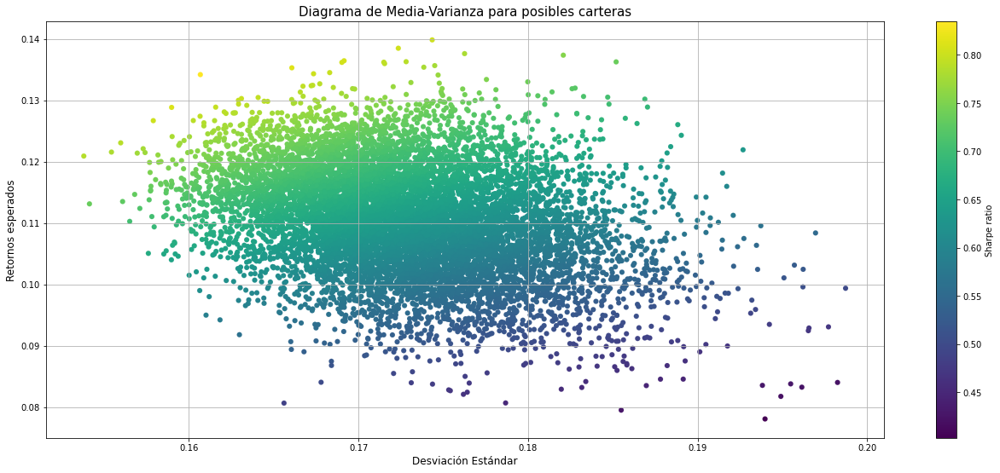

In [18]:
fig = plt.figure(figsize = (22,9))          
plt.scatter(pvol, pret, marker= 'o', lw = 0.1, c = pret/pvol) # c = lista/escala de colores; definimos en c el ratio de Sharpe
plt.grid(True)
plt.title('Diagrama de Media-Varianza para posibles carteras', fontsize = 15)
plt.xlabel('Desviación Estándar', fontsize = 12)
plt.ylabel('Retornos esperados', fontsize = 12)
plt.colorbar(label = 'Sharpe ratio')

Optimizacion

In [19]:
def estadísticas(weights):
    '''
    Esta funcion nos devuelve el retorno medio (pret), la desviacion estandard (pvol) y Sharpe ratio del portafolio (pret/pvol)
    con determinados pesos en cada activo.
    '''
    
    weights = np.array(weights) 
    pret = np.sum(ret_anuales * weights) # Nos devolveria un retorno de un portafolio con determinados pesos.
    pvol = np.sqrt(np.dot(weights.T, np.dot(cov_anuales, weights)))  # Nos devolveria la volatilidad de un portafolio con determinados pesos.
    
    return np.array([pret, pvol, pret / pvol])

In [20]:
def min_func_sharpe(weights):    
    '''
    Esta funcion nos devuelve el negativo del Sharpe ratio. Por qué negativo? Porque vamos a usar la función 'minimize', 
     y como queremos maximizar el ratio, tambien podemos minimizar su opuesto.
    '''
    return -estadísticas(weights)[2]

In [21]:
restric = ({'type': 'eq', 'fun': lambda x:  np.sum(x) - 1})  #La restricción de igualdad significa que el resultado de la función de restricción debe ser cero, mientras que la desigualdad significa que no debe ser negativo.

In [22]:
tuple((0, 1) for x in range(nde))

((0, 1),
 (0, 1),
 (0, 1),
 (0, 1),
 (0, 1),
 (0, 1),
 (0, 1),
 (0, 1),
 (0, 1),
 (0, 1),
 (0, 1))

In [23]:
límites = tuple((0, 1) for x in range(nde))

In [24]:
'''
La funcion minimize tiene como argumento: 
    *la funcion a minimizar, 
    *un vector de estimación (suposición) inicial, / suponer que se invierte la misma cantidad en todos los ETFs
    *el algoritmo optimizador, 
    *los limites de las variables, y 
    *las restricciones de la optimizacion 

Buscamos el portafolio con maximo Sharpe ratio
'''

opts = sco.minimize(min_func_sharpe, nde * [1. / nde], method='SLSQP',bounds=límites, constraints=restric) 

print(opts)

     fun: -0.9140922571042798
     jac: array([ 1.06159423e+00,  3.65855627e-01,  2.19260328e-01, -1.22040510e-05,
        8.68365169e-05,  5.16079366e-04,  2.67230079e-01, -4.14878130e-04,
        2.82147907e-01,  3.20740044e-04,  3.13241035e-01])
 message: 'Optimization terminated successfully'
    nfev: 96
     nit: 8
    njev: 8
  status: 0
 success: True
       x: array([2.91011288e-18, 2.33248558e-16, 4.10369468e-17, 2.10864945e-01,
       1.36440439e-01, 2.49698864e-01, 4.54372875e-16, 3.63498328e-01,
       2.02348072e-16, 3.94974239e-02, 0.00000000e+00])


In [25]:
opt_weights = pd.DataFrame(columns = ['Max Sharpe Ratio'], index= ret_etfs.columns)
opt_weights['Max Sharpe Ratio'] = opts['x'].round(3)
opt_weights

,Max Sharpe Ratio
XLE,0.000
XLB,0.000
XLI,0.000
XLY,0.211
XLP,0.136
XLV,0.250
XLF,0.000
VGT,0.363
VOX,0.000
XLU,0.039


In [26]:
estadísticas(opt_weights['Max Sharpe Ratio'])

array([0.1544596 , 0.168976  , 0.91409196])

In [27]:
Performance_maxsharpe=pd.DataFrame(data=estadísticas(opt_weights['Max Sharpe Ratio']),index=['Rendimiento','Riesgo','Ratio Sharpe'],columns=['Max Sharpe Ratio'])
Performance_maxsharpe.T

,Rendimiento,Riesgo,Ratio Sharpe
Max Sharpe Ratio,0.15446,0.168976,0.914092


Portafolio de min varianza

In [28]:
def min_func_varianza(weights):   
    '''
    Esta funcion nos devuelve la varianza
    
    '''
    return estadísticas(weights)[1]**2

In [29]:
optv = sco.minimize(min_func_varianza, nde * [1. / nde,],method='SLSQP', bounds=límites,constraints=restric)
opt_weights['Min Varianza'] = optv['x'].round(3)
opt_weights

,Max Sharpe Ratio,Min Varianza
XLE,0.000,0.000
XLB,0.000,0.000
XLI,0.000,0.000
XLY,0.211,0.000
XLP,0.136,0.687
XLV,0.250,0.146
XLF,0.000,0.000
VGT,0.363,0.000
VOX,0.000,0.067
XLU,0.039,0.100


In [30]:
estadísticas(opt_weights['Min Varianza'])

array([0.10934367, 0.1408367 , 0.77638619])

In [31]:
Performance_minvar=pd.DataFrame(data=estadísticas(opt_weights['Min Varianza']),index=['Rendimiento','Riesgo','Ratio Sharpe'],columns=['Min Varianza'])
Performance_minvar.T

,Rendimiento,Riesgo,Ratio Sharpe
Min Varianza,0.109344,0.140837,0.776386


Portafolio Ingenuo

In [32]:
w = np.array(nde * [1. / nde])

print(np.sum(w))


naive_ret = np.sum(ret_etfs.mean() * w) * 252


naive_vol = np.sqrt(np.dot(w.T, np.dot(ret_etfs.cov() * 252, w)))

1.0


In [33]:
estadísticas(w)

array([0.1103324 , 0.17203329, 0.64134335])

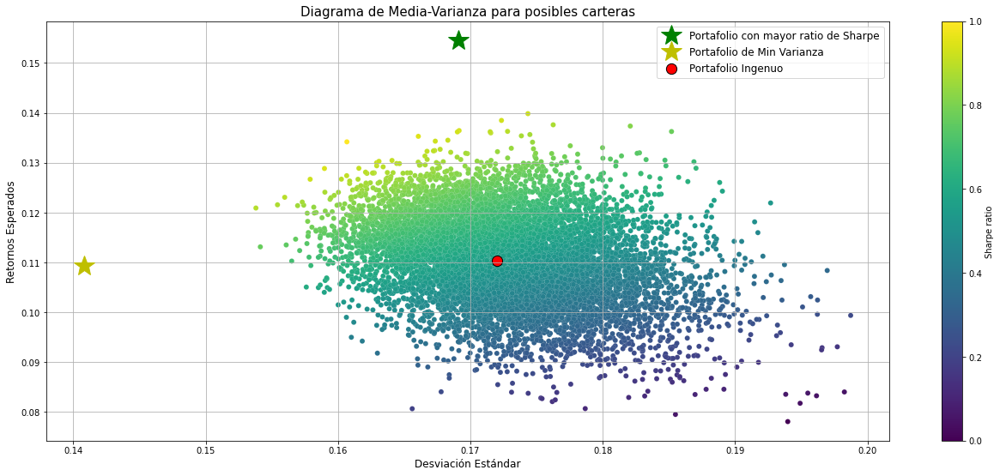

In [34]:
plt.figure(figsize=(22,9))

# composicion aleatoria de portafolios
plt.scatter(pvol, pret, marker= 'o', lw = 0.1, c = pret/pvol, edgecolors='w')

# cartera con el mayor ratio de Sharpe

plt.plot(estadísticas(opts['x'])[1], estadísticas(opts['x'])[0],'g*', markersize=25.0, label='Portafolio con mayor ratio de Sharpe')

# portafolio de min varianza
plt.plot(estadísticas(optv['x'])[1], estadísticas(optv['x'])[0],'y*', markersize=25.0, label='Portafolio de Min Varianza')


plt.scatter(naive_vol, naive_ret, c='red', s=150, marker='o',label='Portafolio Ingenuo', edgecolors='black')


plt.grid(True)
plt.title('Diagrama de Media-Varianza para posibles carteras', fontsize = 15)
plt.xlabel('Desviación Estándar', fontsize = 12)
plt.ylabel('Retornos Esperados', fontsize = 12)
plt.colorbar(label='Sharpe ratio')
plt.legend(fontsize=12, loc = 'best')

Estimacion de la Frontera Eficiente

In [35]:
restric1 = {'type': 'eq', 'fun': lambda x:  estadísticas(x)[0] - fe_rets}
restric2 = {'type': 'eq', 'fun': lambda x:  np.sum(x) - 1}
límites = tuple((0, 1) for x in range(nde))

def min_func_port(w):
    '''
    Devuelve la desviacion estandar
    '''  
    return estadísticas(w)[1]

In [36]:
fe_rets = np.linspace(0.109344, 0.185484, 100) #generamos 100 rendimientos aleatorios entre los limites: 0,0025-ret_anual de tec. infor.
fe_vols = []

fe_we = []

'''
Llevamos a cabo la minimizacion reiteradas veces, para cada valor en fe_rets, buscamos la mínima varianza. 
    fe_vols guarda la minima volatilidad para cada fe_ret
    fe_we guarda los weights optimos para cada par (fe_ret, fe_vol)
'''

for fe_ret in fe_rets:
    restricciones = ({'type': 'eq', 'fun': lambda x:  estadísticas(x)[0] - fe_ret}, {'type': 'eq', 'fun': lambda x:  np.sum(x) - 1})
    valores = sco.minimize(min_func_port, nde * [1. / nde,], method='SLSQP',  bounds=límites, constraints=restricciones)
    fe_vols.append(valores['fun'])
    fe_we.append(valores['x'].round(3))
       
fe_vols = np.array(fe_vols)

ind = np.argmin(fe_vols) # Solo nos importa la parte eficiente de la frontera (cortamos a partir de la min volatilidad en adelante)
fe_vols = fe_vols[ind:]
fe_rets = fe_rets[ind:]

In [37]:
fe_w = pd.DataFrame(fe_we,columns=ret_etfs.columns)
fe_w

,XLE,XLB,XLI,XLY,XLP,XLV,XLF,VGT,VOX,XLU,VNQ
0,0.0,0.0,0.0,0.000,0.683,0.149,0.0,0.000,0.077,0.090,0.0
1,0.0,0.0,0.0,0.001,0.679,0.164,0.0,0.000,0.065,0.091,0.0
2,0.0,0.0,0.0,0.013,0.673,0.166,0.0,0.000,0.060,0.088,0.0
3,0.0,0.0,0.0,0.019,0.668,0.175,0.0,0.000,0.054,0.085,0.0
4,0.0,0.0,0.0,0.033,0.663,0.171,0.0,0.000,0.043,0.089,0.0
...,...,...,...,...,...,...,...,...,...,...,...
95,0.0,0.0,0.0,0.119,0.000,0.000,0.0,0.881,0.000,0.000,0.0
96,0.0,0.0,0.0,0.089,0.000,0.000,0.0,0.911,0.000,0.000,0.0
97,0.0,0.0,0.0,0.059,0.000,0.000,0.0,0.941,0.000,0.000,0.0
98,0.0,0.0,0.0,0.030,0.000,0.000,0.0,0.970,0.000,0.000,0.0


In [38]:
estadísticas(fe_w.loc[63])

array([0.1576388 , 0.17253626, 0.91365604])

In [39]:
fe_w.loc[63:63]

,XLE,XLB,XLI,XLY,XLP,XLV,XLF,VGT,VOX,XLU,VNQ
63,0.0,0.0,0.0,0.23,0.095,0.256,0.0,0.387,0.0,0.031,0.0


In [41]:
Performance_portf63=pd.DataFrame(data=estadísticas(fe_w.loc[63]),index=['Rendimiento','Riesgo','Ratio Sharpe'],columns=['portf63'])
Performance_portf63.T

,Rendimiento,Riesgo,Ratio Sharpe
portf63,0.157639,0.172536,0.913656


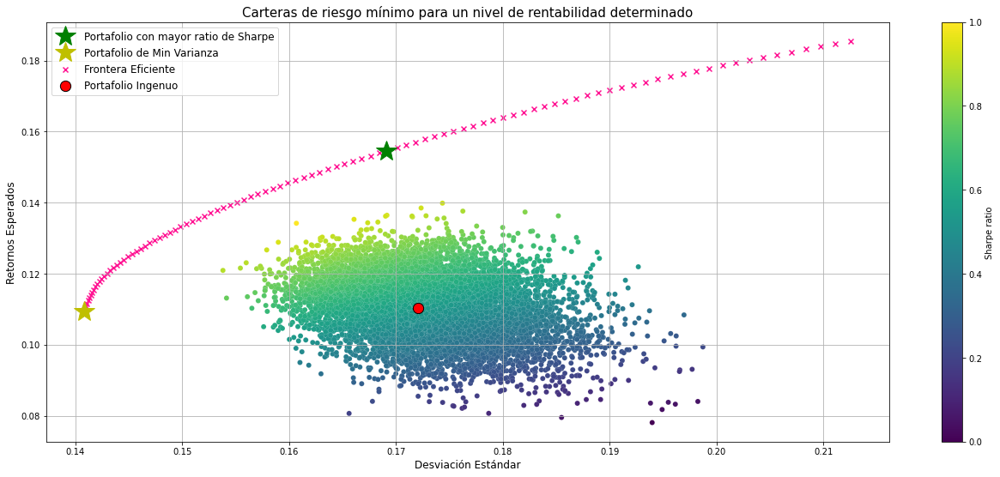

In [42]:
plt.figure(figsize=(22,9))

# composicion aleatoria de portafolios
plt.scatter(pvol, pret, marker= 'o', lw = 0.1, c = pret/pvol, edgecolors='w')

# frontera eficiente
plt.scatter(fe_vols, fe_rets, c = 'deeppink', marker='x', label='Frontera Eficiente', edgecolors='black')

# cartera con el mayor ratio de Sharpe

plt.plot(estadísticas(opts['x'])[1], estadísticas(opts['x'])[0],'g*', markersize=25.0, label='Portafolio con mayor ratio de Sharpe')

# portafolio de min varianza
plt.plot(estadísticas(optv['x'])[1], estadísticas(optv['x'])[0],'y*', markersize=25.0, label='Portafolio de Min Varianza')

plt.scatter(naive_vol, naive_ret, c='red', s=150, marker='o',label='Portafolio Ingenuo', edgecolors='black')


plt.grid(True)
plt.title('Carteras de riesgo mínimo para un nivel de rentabilidad determinado', fontsize = 15)
plt.xlabel('Desviación Estándar', fontsize = 12)
plt.ylabel('Retornos Esperados', fontsize = 12)
plt.colorbar(label='Sharpe ratio')
plt.legend(fontsize=12, loc = 'best')

Analisis de Componentes Principales

In [47]:
train_ret_etfs=ret_etfs.iloc[:2161] #trabajamos con el 85% de las cotizaciones-con nueve años excepto el ultimo
train_ret_etfs

,XLE,XLB,XLI,XLY,XLP,XLV,XLF,VGT,VOX,XLU,VNQ
Date,,,,,,,,,,,
2011-06-01,-0.0242,-0.0317,-0.0332,-0.0230,-0.0103,-0.0139,-0.0340,-0.0224,-0.0182,-0.0104,-0.0291
2011-06-02,-0.0004,0.0016,0.0052,-0.0023,-0.0116,-0.0022,0.0007,0.0008,0.0000,-0.0030,-0.0073
2011-06-03,0.0003,-0.0128,-0.0135,-0.0130,-0.0095,-0.0096,-0.0065,-0.0149,-0.0185,-0.0069,0.0040
2011-06-06,-0.0228,-0.0100,-0.0072,-0.0106,-0.0051,-0.0060,-0.0192,-0.0085,-0.0111,-0.0045,-0.0148
2011-06-07,0.0000,0.0037,-0.0006,0.0010,-0.0022,0.0020,-0.0020,-0.0023,-0.0014,0.0012,0.0105
...,...,...,...,...,...,...,...,...,...,...,...
2019-12-24,-0.0005,0.0011,-0.0040,0.0023,0.0013,-0.0013,0.0023,0.0001,-0.0010,0.0014,0.0026
2019-12-26,-0.0003,0.0044,0.0023,0.0121,0.0010,-0.0007,0.0055,0.0077,0.0077,0.0017,0.0044
2019-12-27,-0.0042,-0.0038,-0.0009,-0.0001,0.0044,0.0003,-0.0026,-0.0004,-0.0019,0.0030,0.0032


In [48]:
from sklearn.decomposition import PCA

In [49]:
pca = PCA(n_components = nde) # podemos extarer tantos PC como variables observadas tengamos

In [50]:
principal = pd.DataFrame(pca.fit_transform(train_ret_etfs), # Ajusta el modelo y aplica la reduccion de dimensionalidad sobre los retornos.
                         
                         columns = ['PC'+str(i) for i in range(1, nde+1)], # Columnas = PC1, .., PC11
                         index = train_ret_etfs.index) 
principal= principal*(-1)
principal

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11
Date,,,,,,,,,,,
2011-06-01,-0.079827,-0.002811,0.000950,0.012684,-0.007428,-0.004346,-0.004596,-0.000911,-0.000961,0.003274,0.003907
2011-06-02,-0.004461,-0.010411,-0.001637,-0.000789,0.001943,0.000704,0.004384,-0.000834,0.007948,-0.005047,-0.003301
2011-06-03,-0.031065,-0.001944,0.014160,-0.011318,0.003373,0.004280,-0.011396,-0.001392,0.000275,0.001129,0.000393
2011-06-06,-0.039226,0.001011,-0.008222,0.001864,-0.008037,0.000774,0.005921,0.003612,0.000631,-0.001157,-0.003158
2011-06-07,0.001296,0.005241,0.003623,-0.004322,0.001769,0.005195,-0.002851,0.005932,0.001554,-0.002078,0.001403
...,...,...,...,...,...,...,...,...,...,...,...
2019-12-24,-0.000303,0.002082,0.000890,-0.001916,0.001298,0.000999,-0.000443,-0.001142,-0.001192,0.001402,0.004740
2019-12-26,0.012778,0.001670,-0.006205,0.002391,0.005014,0.004127,0.002592,-0.002586,-0.001911,-0.002893,0.005075
2019-12-27,-0.003957,0.007094,-0.000567,-0.000136,-0.001890,0.000505,-0.001200,-0.000662,-0.002858,0.000839,-0.001189


In [51]:
loadings = pd.DataFrame(pca.components_.T,  # Nos da la matriz de loadings: como afecta cada PC a X
                        columns = ['PC'+str(i) for i in range(1, nde+1)],
                        index = ret_etfs.columns)
loadings= loadings*(-1)
loadings

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11
XLE,0.380058,-0.419512,0.727862,0.213713,-0.028796,0.020448,-0.286309,-0.123960,-0.071668,0.002931,-0.019440
XLB,0.358841,-0.189578,0.085302,-0.236709,-0.132412,0.164694,0.532225,0.535727,0.137532,0.168599,0.331242
XLI,0.335745,-0.099356,-0.100104,-0.175648,-0.079660,-0.023923,0.273555,0.014309,-0.077350,-0.390624,-0.772014
XLY,0.308501,-0.006642,-0.265367,0.085678,-0.039077,0.169992,-0.047009,-0.140346,-0.424386,-0.605002,0.478080
XLP,0.192664,0.277370,-0.007128,0.076494,-0.244348,-0.246509,0.072013,0.030723,-0.717379,0.481857,-0.081384
XLV,0.267395,0.083401,-0.231915,0.073921,-0.440663,-0.365686,-0.530876,0.396168,0.298188,-0.081557,0.006232
XLF,0.367931,-0.120598,-0.158675,-0.514529,0.334850,-0.459341,-0.054584,-0.401333,0.120597,0.177473,0.164194
VGT,0.334415,-0.089476,-0.383954,0.251081,-0.208308,0.511962,-0.038725,-0.383332,0.233640,0.391861,-0.087269
VOX,0.269886,0.106177,-0.129145,0.639634,0.598000,-0.226373,0.164062,0.205808,0.100412,0.020357,-0.038179
XLU,0.151199,0.601593,0.335452,0.109272,-0.289497,-0.154118,0.332962,-0.352618,0.326519,-0.166113,0.117403


Varianza Explicada

In [52]:
var = pca.explained_variance_ratio_  # Porcentaje de la varianza expicada por cada uno de los componentes seleccionados.

var_factors = pd.DataFrame(columns = ['PC', 'Varianza'])

var_factors['PC'] = ['PC'+str(i) for i in range(1, nde+1)]
var_factors['Varianza']= [var[i].round(4) for i in range(len(var))]

var_factors

,PC,Varianza
0,PC1,0.7025
1,PC2,0.0832
2,PC3,0.0558
3,PC4,0.0326
4,PC5,0.0280
5,PC6,0.0244
6,PC7,0.0218
7,PC8,0.0180
8,PC9,0.0142
9,PC10,0.0103


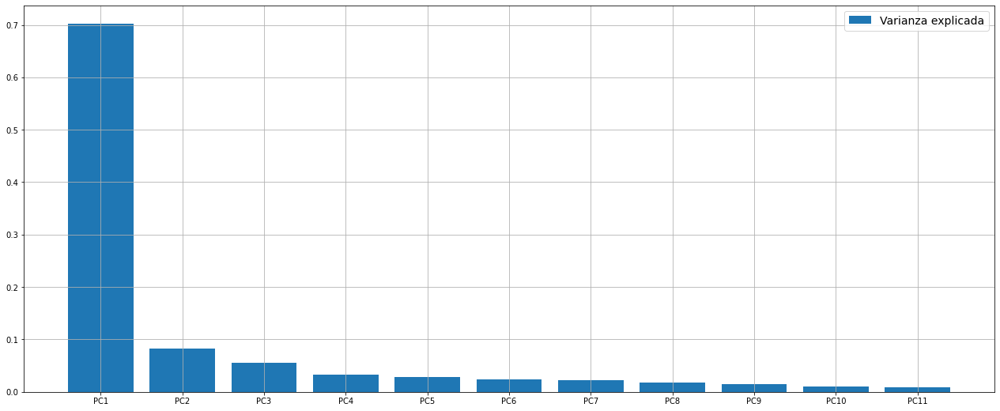

In [53]:
fig = plt.figure(figsize = (22,9))
plt.bar(var_factors['PC'], var_factors['Varianza'], label = 'Varianza explicada')
plt.legend(loc = 'upper right', fontsize = 14)
plt.grid(True)

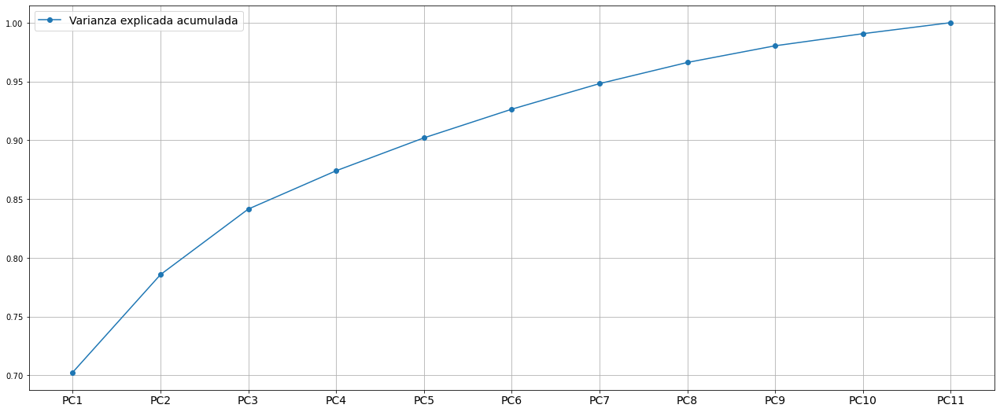

In [54]:
fig = plt.figure(figsize = (22,9))
plt.plot(var_factors['PC'], np.cumsum(var_factors['Varianza']), label = 'Varianza explicada acumulada', marker = 'o')
plt.legend(loc = 'upper left', fontsize = 14)
plt.xticks(size = 14)
plt.grid(True)

Grafica del Primer Componente Principal

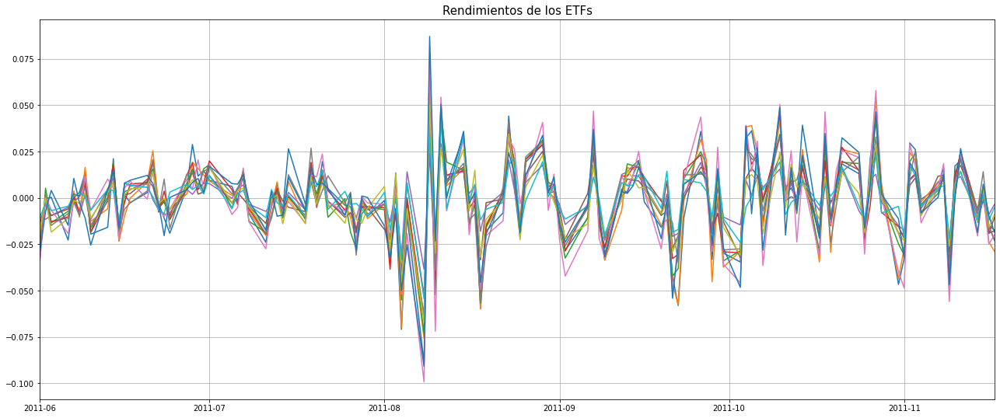

In [55]:
fig = plt.figure(figsize = (22,9))

plt.plot(ret_etfs[:120])
plt.autoscale(axis = 'x', tight = True)
plt.title('Rendimientos de los ETFs', fontsize = 15)
plt.grid(True)

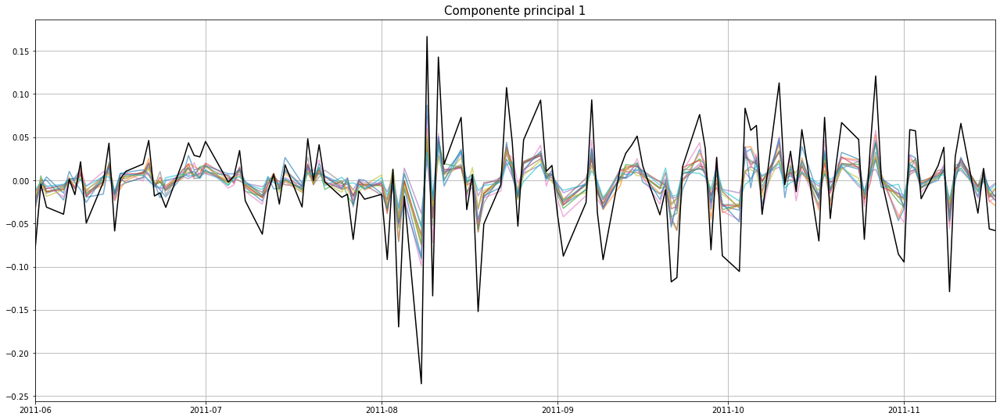

In [56]:
fig = plt.figure(figsize = (22,9))

plt.plot(ret_etfs[:120], alpha = 0.6)
plt.plot(principal['PC1'][:120], color = 'black') #principal es la matriz de los componentes principales
plt.autoscale(axis = 'x', tight = True)
plt.title('Componente principal 1', fontsize = 15)
plt.grid(True)

ValueError: num must be 1 <= num <= 6, not 7

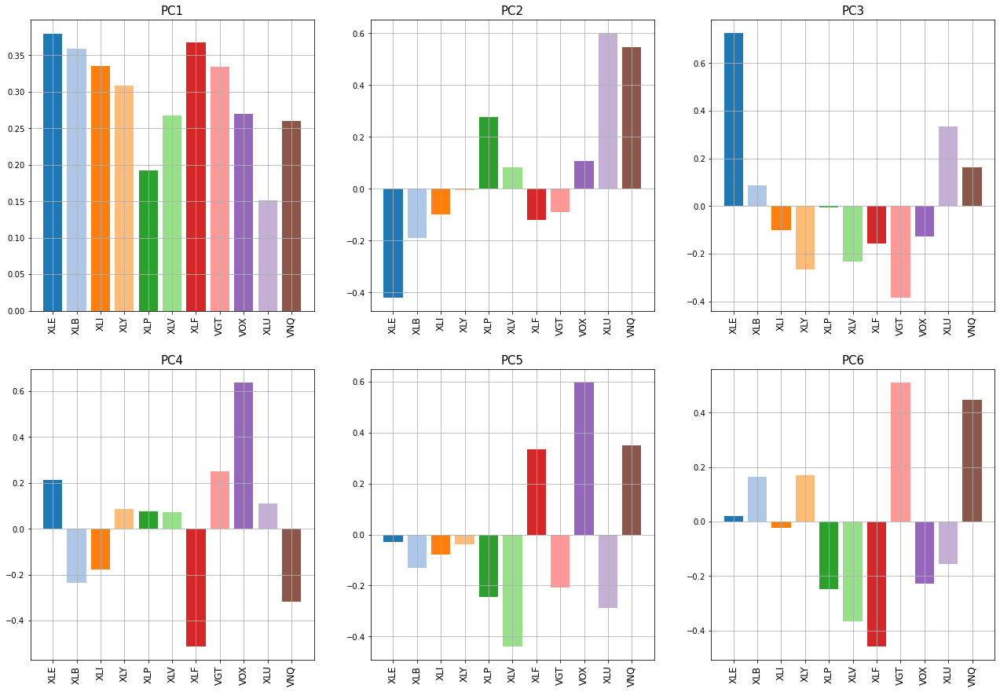

In [57]:
fig = plt.figure(figsize = (22,15))

for i in range(len(loadings.columns)):
    plt.subplot(2,3,i+1)
    plt.bar(loadings.index, loadings['PC'+str(i+1)], color = sns.color_palette(palette = 'tab20'))
    plt.title(loadings.columns.values[i], size = 15)
    plt.xticks(rotation = 90, size = 12)
    plt.grid(True)

plt.tight_layout(pad=3.0)

EigenPortfolios

In [58]:
# getting the principal components of fitted pca model

pcs = pca.components_
normalized_pcs = list()

# normalized to put in the form of portfolio weights
for eigen_vector in pcs:
    # scaling  values to sum to 1 
    normalized_values = eigen_vector / eigen_vector.sum()
    normalized_pcs.append(normalized_values)

    
pc_w = normalized_pcs[0]  #pesos del primer componente
eigen_prtf1 = pd.DataFrame(data ={'weights': pc_w.squeeze()}, index = ret_etfs.columns) #construimos el dataframe 

pc_w_2 = normalized_pcs[1] #pesos del segundo componente
eigen_prtf2 = pd.DataFrame(data ={'weights': pc_w_2.squeeze()}, index = ret_etfs.columns)

pc_w_3 = normalized_pcs[2] #pesos del tercero componente
eigen_prtf3 = pd.DataFrame(data ={'weights': pc_w_3.squeeze()}, index = ret_etfs.columns)

pc_w_4 = normalized_pcs[3] 
eigen_prtf4 = pd.DataFrame(data ={'weights': pc_w_4.squeeze()}, index = ret_etfs.columns)

pc_w_5 = normalized_pcs[4] 
eigen_prtf5 = pd.DataFrame(data ={'weights': pc_w_5.squeeze()}, index = ret_etfs.columns)

pc_w_6 = normalized_pcs[5] 
eigen_prtf6 = pd.DataFrame(data ={'weights': pc_w_6.squeeze()}, index = ret_etfs.columns)

pc_w_7 = normalized_pcs[6] 
eigen_prtf7 = pd.DataFrame(data ={'weights': pc_w_7.squeeze()}, index = ret_etfs.columns)

pc_w_8 = normalized_pcs[7] 
eigen_prtf8 = pd.DataFrame(data ={'weights': pc_w_8.squeeze()}, index = ret_etfs.columns)

pc_w_9 = normalized_pcs[8] 
eigen_prtf9 = pd.DataFrame(data ={'weights': pc_w_9.squeeze()}, index = ret_etfs.columns)

pc_w_10 = normalized_pcs[9] 
eigen_prtf10 = pd.DataFrame(data ={'weights': pc_w_10.squeeze()}, index = ret_etfs.columns)

pc_w_11 = normalized_pcs[10] 
eigen_prtf11 = pd.DataFrame(data ={'weights': pc_w_11.squeeze()}, index = ret_etfs.columns)

print('Suma de los pesos del primer eigen-portfolio: %.2f' % np.sum(eigen_prtf1))

Suma de los pesos del primer eigen-portfolio: 1.00


In [59]:
Eigenportfolios= pd.DataFrame(data=(normalized_pcs[0],
        normalized_pcs[1],
        normalized_pcs[2],
        normalized_pcs[3],
        normalized_pcs[4],
        normalized_pcs[5],
        normalized_pcs[6],
        normalized_pcs[7],
        normalized_pcs[8],
        normalized_pcs[9],
        normalized_pcs[10]),index=('eigen_prtf1','eigen_prtf2','eigen_prtf3','eigen_prtf4','eigen_prtf5','eigen_prtf6','eigen_prtf7','eigen_prtf8','eigen_prtf9','eigen_prtf10','eigen_prtf11'))

Eigenportfolios.columns = tickers_etfs
Eigenportfolios

,XLE,XLB,XLI,XLY,XLP,XLV,XLF,VGT,VOX,XLU,VNQ
eigen_prtf1,0.117804,0.111228,0.104069,0.095624,0.059719,0.082883,0.114045,0.103657,0.083655,0.046866,0.080451
eigen_prtf2,-0.608203,-0.274847,-0.144045,-0.009629,0.402128,0.120913,-0.174841,-0.129721,0.153935,0.872182,0.792129
eigen_prtf3,20.096739,2.355249,-2.763926,-7.326944,-0.196818,-6.403329,-4.381106,-10.601206,-3.565782,9.262053,4.525070
eigen_prtf4,1.033505,-1.144713,-0.849428,0.414336,0.369922,0.357478,-2.488239,1.214216,3.093244,0.528433,-1.528755
eigen_prtf5,0.160623,0.738589,0.444342,0.217970,1.362964,2.458004,-1.867778,1.161934,-3.335624,1.614806,-1.955830
eigen_prtf6,-0.126852,-1.021703,0.148410,-1.054572,1.529254,2.268591,2.849594,-3.176034,1.404340,0.956097,-2.777124
eigen_prtf7,-4.859273,9.032997,4.642818,-0.797847,1.222207,-9.010097,-0.926402,-0.657245,2.784490,5.651069,-6.082718
eigen_prtf8,19.305189,-83.432637,-2.228465,21.857150,-4.784731,-61.698045,62.502437,59.698988,-32.051940,54.915717,-33.083662
eigen_prtf9,0.747216,-1.433909,0.806451,4.424660,7.479414,-3.108912,-1.257350,-2.435942,-1.046896,-3.404299,0.229567
eigen_prtf10,0.090851,5.225297,-12.106414,-18.750530,14.933969,-2.527658,5.500332,12.144749,0.630924,-5.148256,1.006737


In [60]:
eigen_prtf1

,weights
XLE,0.117804
XLB,0.111228
XLI,0.104069
XLY,0.095624
XLP,0.059719
XLV,0.082883
XLF,0.114045
VGT,0.103657
VOX,0.083655
XLU,0.046866


In [61]:
Performance_eigenportfolios= pd.DataFrame(data=(estadísticas(normalized_pcs[0]),
        estadísticas(normalized_pcs[1]),
        estadísticas(normalized_pcs[2]),
        estadísticas(normalized_pcs[3]),
        estadísticas(normalized_pcs[4]),
        estadísticas(normalized_pcs[5]),
        estadísticas(normalized_pcs[6]),
        estadísticas(normalized_pcs[7]),
        estadísticas(normalized_pcs[8]),
        estadísticas(normalized_pcs[9]),
        estadísticas(normalized_pcs[10])),index=('eigen_prtf1','eigen_prtf2','eigen_prtf3','eigen_prtf4','eigen_prtf5','eigen_prtf6','eigen_prtf7','eigen_prtf8','eigen_prtf9','eigen_prtf10','eigen_prtf11'))
Performance_eigenportfolios.columns= 'Retornos','Volatilidad','Ratio de Sharpe'
Performance_eigenportfolios

,Retornos,Volatilidad,Ratio de Sharpe
eigen_prtf1,0.109427,0.179900,0.608267
eigen_prtf2,0.141337,0.269747,0.523961
eigen_prtf3,-3.832784,4.633025,-0.827275
eigen_prtf4,0.037734,0.564512,0.066843
eigen_prtf5,0.322773,0.568190,0.568072
eigen_prtf6,-0.015714,0.595189,-0.026401
eigen_prtf7,0.293635,1.543245,0.190271
eigen_prtf8,4.409450,12.795341,0.344614
eigen_prtf9,-0.018628,0.733871,-0.025383
eigen_prtf10,-0.162240,1.999464,-0.081142


In [62]:
# Computing weights for second eigenportfolio
pc_w_2 = normalized_pcs[1]
eigen_prtf2 = pd.DataFrame(data ={'weights': pc_w_2.squeeze()}, index = ret_etfs.columns)



print('Suma de los pesos del segundo eigen-portfolio: %.2f' % np.sum(eigen_prtf2))

Suma de los pesos del segundo eigen-portfolio: 1.00


In [63]:
eigen_prtf2

,weights
XLE,-0.608203
XLB,-0.274847
XLI,-0.144045
XLY,-0.009629
XLP,0.402128
XLV,0.120913
XLF,-0.174841
VGT,-0.129721
VOX,0.153935
XLU,0.872182


Calcular nuevamente los PC, esta vez sobre la totalidad de los datos

In [64]:
principal_c = pd.DataFrame(pca.fit_transform(ret_etfs), # Ajusta el modelo y aplica la reduccion de dimensionalidad sobre los retornos.
                         
                         columns = ['PC'+str(i) for i in range(1, nde+1)], # Columnas = PC1, .., PC11
                         index = ret_etfs.index) 
principal_c= principal_c*(-1)
principal_c

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11
Date,,,,,,,,,,,
2011-06-01,-0.079827,0.001220,-0.003025,0.013611,0.008287,-0.003746,-0.004176,-0.001822,-0.000463,-0.001383,-0.003485
2011-06-02,-0.005004,0.008100,0.005417,-0.002556,-0.000507,0.000950,0.004532,-0.002117,0.007586,0.005170,0.004204
2011-06-03,-0.030145,0.010009,-0.015943,-0.004104,-0.007452,0.004378,-0.010365,-0.000981,0.001004,-0.002449,-0.001774
2011-06-06,-0.039831,-0.006302,0.004086,-0.000629,0.007498,0.003719,0.003062,0.000987,-0.000144,0.001890,0.004065
2011-06-07,0.001508,-0.002479,-0.005742,-0.002013,-0.004556,0.005367,-0.002446,0.005956,0.001787,0.001372,-0.001407
...,...,...,...,...,...,...,...,...,...,...,...
2021-05-24,0.026567,-0.000981,0.008376,0.009378,-0.011981,0.003019,0.002995,0.002738,0.000102,-0.003781,0.001530
2021-05-25,-0.020066,-0.010652,0.012597,-0.001704,-0.006064,0.003412,-0.002877,0.003351,-0.007481,0.001139,0.002085
2021-05-26,0.009233,0.005088,-0.000481,0.004899,-0.009491,0.000129,0.003487,-0.002684,-0.003356,0.004897,-0.001725


In [65]:
np.cumsum(principal_c)

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11
Date,,,,,,,,,,,
2011-06-01,-7.982672e-02,1.219739e-03,-3.024979e-03,1.361148e-02,8.286684e-03,-3.745912e-03,-4.176158e-03,-1.822121e-03,-4.627959e-04,-1.382780e-03,-3.485340e-03
2011-06-02,-8.483102e-02,9.319762e-03,2.391703e-03,1.105528e-02,7.779979e-03,-2.796082e-03,3.559236e-04,-3.939416e-03,7.122902e-03,3.787688e-03,7.185518e-04
2011-06-03,-1.149763e-01,1.932870e-02,-1.355153e-02,6.951757e-03,3.278315e-04,1.581779e-03,-1.000920e-02,-4.920837e-03,8.126441e-03,1.338278e-03,-1.055087e-03
2011-06-06,-1.548075e-01,1.302710e-02,-9.465031e-03,6.322539e-03,7.825657e-03,5.300397e-03,-6.947544e-03,-3.933753e-03,7.982294e-03,3.227858e-03,3.009629e-03
2011-06-07,-1.532995e-01,1.054791e-02,-1.520700e-02,4.309692e-03,3.269735e-03,1.066754e-02,-9.393246e-03,2.021992e-03,9.769762e-03,4.600286e-03,1.602492e-03
...,...,...,...,...,...,...,...,...,...,...,...
2021-05-24,-5.761533e-04,-4.744071e-04,-1.301821e-02,8.828239e-03,1.982067e-02,-9.157200e-05,-3.946715e-03,-1.541777e-03,7.995284e-03,-1.080134e-02,-5.054681e-03
2021-05-25,-2.064205e-02,-1.112676e-02,-4.207747e-04,7.124233e-03,1.375645e-02,3.320798e-03,-6.824196e-03,1.809466e-03,5.145986e-04,-9.662410e-03,-2.970123e-03
2021-05-26,-1.140904e-02,-6.039098e-03,-9.017744e-04,1.202314e-02,4.265113e-03,3.449999e-03,-3.337644e-03,-8.741039e-04,-2.840913e-03,-4.765666e-03,-4.694789e-03


Graficamos el Segundo EigenPortfolio vs PC1

In [66]:
if ret_etfs is not None:
    eigen_prtf2_returns = np.dot(ret_etfs.loc[:, eigen_prtf2.index], eigen_prtf2) #en esta linea obtenemos los rendimietnos diarios;ret_etfs.loc = selecciono la matriz con todas las filas (dias) y solo los activos incluidos en el primer componente principal
    eigen_prtf2_returns = pd.Series(eigen_prtf2_returns.squeeze(), index=ret_etfs.index)
    
    df_plot = pd.DataFrame({'2EigenPortf': eigen_prtf2_returns, 'VGT': ret_etfs.loc[:, 'VGT'],'PC1':principal_c.loc[:,'PC1']}, index=ret_etfs.index)
    fig = px.line(np.cumsum(df_plot))
fig.update_layout( title= "Rendimientos Acumulados",
            xaxis_title="Fecha",
            yaxis_title="Rendimiento",
            font=dict(
                family="Arial, monospace",
                size=12,
                color="black"
            ))
fig.show()

In [67]:
eigen_prtf2_returns

Date
2011-06-01   -0.003461
2011-06-02   -0.014479
2011-06-03   -0.002204
2011-06-06    0.002081
2011-06-07    0.008214
                ...   
2021-05-24   -0.000160
2021-05-25    0.005504
2021-05-26   -0.003592
2021-05-27   -0.015985
2021-05-28    0.009062
Length: 2516, dtype: float64

In [68]:
df_plot

,2EigenPortf,VGT,PC1
Date,,,
2011-06-01,-0.003461,-0.0224,-0.079827
2011-06-02,-0.014479,0.0008,-0.005004
2011-06-03,-0.002204,-0.0149,-0.030145
2011-06-06,0.002081,-0.0085,-0.039831
2011-06-07,0.008214,-0.0023,0.001508
...,...,...,...
2021-05-24,-0.000160,0.0172,0.026567
2021-05-25,0.005504,0.0003,-0.020066
2021-05-26,-0.003592,0.0020,0.009233


In [69]:
np.cumsum(df_plot)

,2EigenPortf,VGT,PC1
Date,,,
2011-06-01,-0.003461,-0.0224,-7.982672e-02
2011-06-02,-0.017940,-0.0216,-8.483102e-02
2011-06-03,-0.020144,-0.0365,-1.149763e-01
2011-06-06,-0.018063,-0.0450,-1.548075e-01
2011-06-07,-0.009849,-0.0473,-1.532995e-01
...,...,...,...
2021-05-24,1.416139,1.8511,-5.761533e-04
2021-05-25,1.421643,1.8514,-2.064205e-02
2021-05-26,1.418051,1.8534,-1.140904e-02


In [72]:
lastyear_ret=df_plot.iloc[2161:] #dede el 1-1-2020 hasta hoy
lastyear_ret

,2EigenPortf,VGT,PC1
Date,,,
2020-01-02,-0.030564,0.0182,0.013267
2020-01-03,0.014238,-0.0106,-0.019756
2020-01-06,0.001221,0.0033,0.007622
2020-01-07,-0.009960,-0.0001,-0.011797
2020-01-08,0.011195,0.0105,0.005128
...,...,...,...
2021-05-24,-0.000160,0.0172,0.026567
2021-05-25,0.005504,0.0003,-0.020066
2021-05-26,-0.003592,0.0020,0.009233


In [73]:
np.cumsum(lastyear_ret)

,2EigenPortf,VGT,PC1
Date,,,
2020-01-02,-0.030564,0.0182,0.013267
2020-01-03,-0.016325,0.0076,-0.006490
2020-01-06,-0.015104,0.0109,0.001132
2020-01-07,-0.025065,0.0108,-0.010665
2020-01-08,-0.013869,0.0213,-0.005537
...,...,...,...
2021-05-24,0.087026,0.4312,0.254788
2021-05-25,0.092531,0.4315,0.234722
2021-05-26,0.088939,0.4335,0.243955


In [74]:
ret2020=df_plot.iloc[2161:2413] #solo el 2020
ret2020

,2EigenPortf,VGT,PC1
Date,,,
2020-01-02,-0.030564,0.0182,0.013267
2020-01-03,0.014238,-0.0106,-0.019756
2020-01-06,0.001221,0.0033,0.007622
2020-01-07,-0.009960,-0.0001,-0.011797
2020-01-08,0.011195,0.0105,0.005128
...,...,...,...
2020-12-23,-0.020596,-0.0091,0.013826
2020-12-24,0.015761,0.0066,0.007680
2020-12-28,0.016774,0.0070,0.010379


Varianza explicada de la totalidad de los periodos

In [75]:
var = pca.explained_variance_ratio_  # Porcentaje de la varianza expicada por cada uno de los componentes seleccionados.

var_factors = pd.DataFrame(columns = ['PC', 'Varianza'])

var_factors['PC'] = ['PC'+str(i) for i in range(1, nde+1)]
var_factors['Varianza']= [var[i].round(4) for i in range(len(var))]

var_factors

,PC,Varianza
0,PC1,0.7357
1,PC2,0.0801
2,PC3,0.0562
3,PC4,0.0287
4,PC5,0.0233
5,PC6,0.0184
6,PC7,0.0168
7,PC8,0.0138
8,PC9,0.0106
9,PC10,0.0087


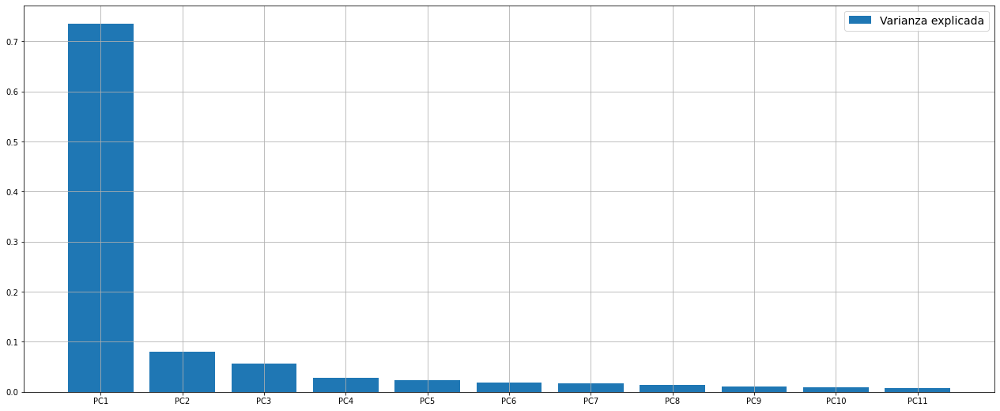

In [76]:
fig = plt.figure(figsize = (22,9))
plt.bar(var_factors['PC'], var_factors['Varianza'], label = 'Varianza explicada')
plt.legend(loc = 'upper right', fontsize = 14)
plt.grid(True)

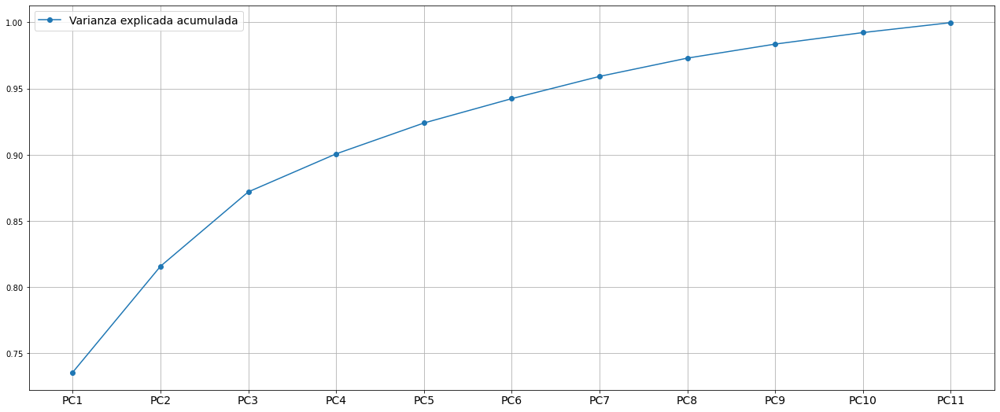

In [77]:
fig = plt.figure(figsize = (22,9))
plt.plot(var_factors['PC'], np.cumsum(var_factors['Varianza']), label = 'Varianza explicada acumulada', marker = 'o')
plt.legend(loc = 'upper left', fontsize = 14)
plt.xticks(size = 14)
plt.grid(True)

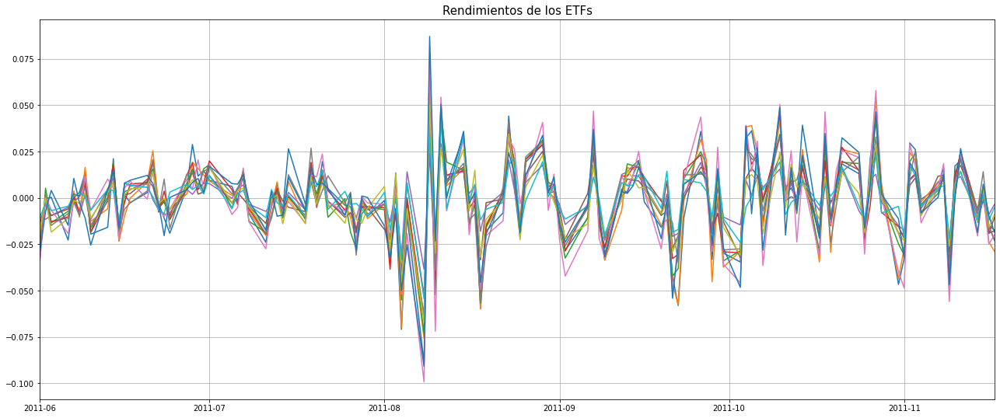

In [78]:
fig = plt.figure(figsize = (22,9))

plt.plot(ret_etfs[:120])
plt.autoscale(axis = 'x', tight = True)
plt.title('Rendimientos de los ETFs', fontsize = 15)
plt.grid(True)

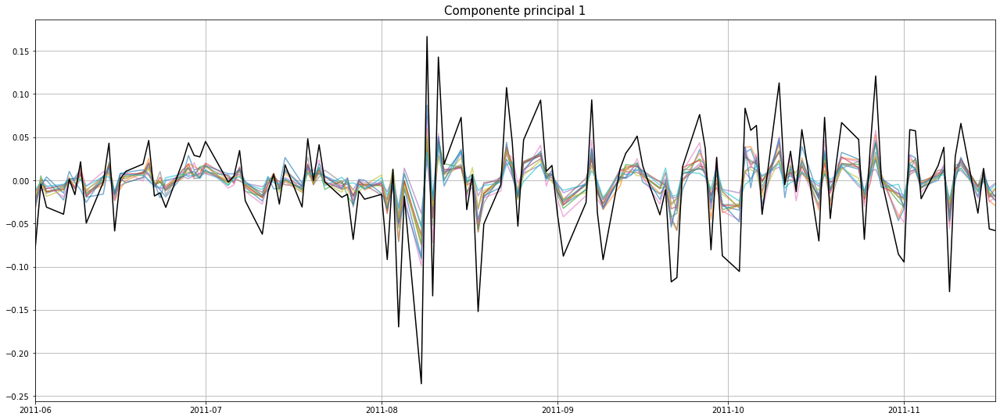

In [79]:
fig = plt.figure(figsize = (22,9))

plt.plot(ret_etfs[:120], alpha = 0.6)
plt.plot(principal['PC1'][:120], color = 'black') #principal es la matriz de los componentes principales
plt.autoscale(axis = 'x', tight = True)
plt.title('Componente principal 1', fontsize = 15)
plt.grid(True)

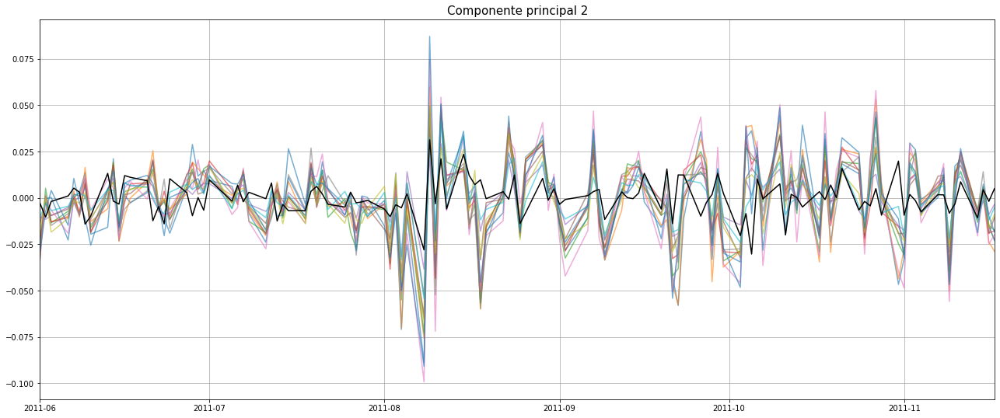

In [80]:
fig = plt.figure(figsize = (22,9))

plt.plot(ret_etfs[:120], alpha = 0.6)
plt.plot(principal['PC2'][:120], color = 'black') #principal es la matriz de los componentes principales
plt.autoscale(axis = 'x', tight = True)
plt.title('Componente principal 2', fontsize = 15)
plt.grid(True)

In [81]:
loadings = pd.DataFrame(pca.components_.T,  # Nos da la matriz de loadings: como afecta cada PC a X
                        columns = ['PC'+str(i) for i in range(1, nde+1)],
                        index = ret_etfs.columns)
loadings= loadings*(-1)
loadings

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11
XLE,0.409782,0.714565,-0.354333,0.401482,0.040181,0.019465,-0.164210,-0.048460,-0.055663,-0.005520,-0.017344
XLB,0.336573,0.127007,0.071010,-0.277144,0.207039,0.376914,0.500243,0.442338,0.187382,-0.197840,-0.289219
XLI,0.328356,0.058502,0.073553,-0.301441,0.094517,0.057083,0.182237,-0.030548,-0.170980,0.368976,0.762083
XLY,0.291001,-0.108063,0.283868,0.053647,-0.125853,0.146261,-0.023184,-0.123801,-0.431644,0.579183,-0.495295
XLP,0.195110,-0.255976,-0.100182,0.049075,0.325338,-0.184137,0.002062,0.068409,-0.710013,-0.484931,0.015847
XLV,0.247063,-0.171341,0.152281,-0.005853,0.465385,-0.188184,-0.599744,0.401973,0.284729,0.178198,-0.016800
XLF,0.365130,0.117957,0.042305,-0.568808,-0.169550,-0.500286,-0.070800,-0.375073,0.152389,-0.188625,-0.209539
VGT,0.315074,-0.153375,0.486880,0.284917,0.003666,0.391982,-0.132649,-0.434016,0.204867,-0.367250,0.150008
VOX,0.261147,-0.155075,0.216890,0.470934,-0.331149,-0.525109,0.373269,0.293813,0.138035,0.010988,0.093299
XLU,0.203712,-0.440963,-0.551147,0.160774,0.319064,-0.008789,0.266373,-0.368070,0.276944,0.203016,-0.090658


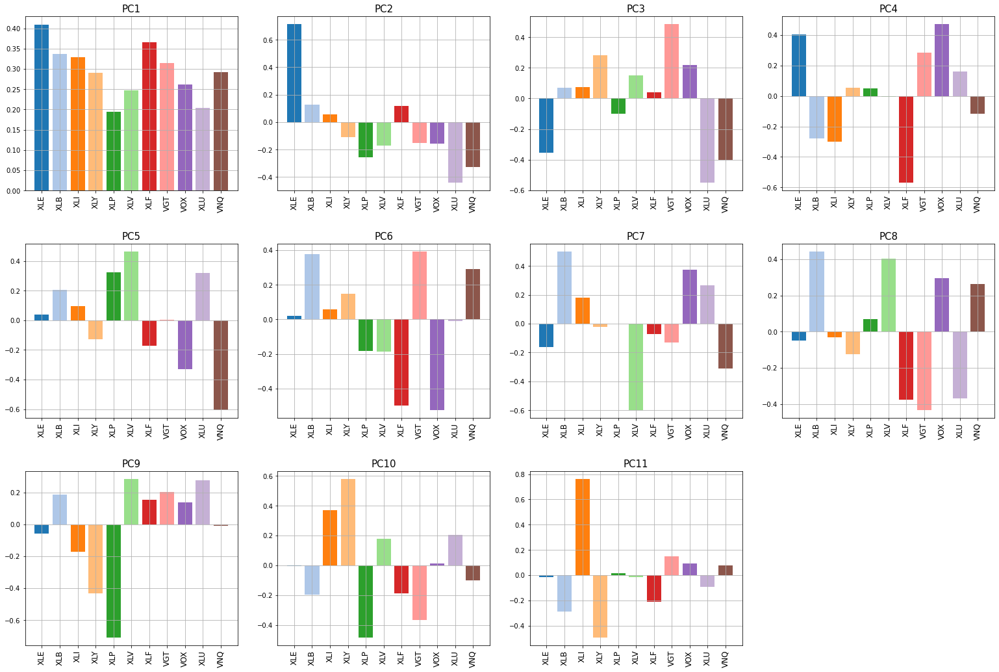

In [83]:
fig = plt.figure(figsize = (22,15))

for i in range(len(loadings.columns)):
    plt.subplot(3,4,i+1)
    plt.bar(loadings.index, loadings['PC'+str(i+1)], color = sns.color_palette(palette = 'tab20'))
    plt.title(loadings.columns.values[i], size = 15)
    plt.xticks(rotation = 90, size = 12)
    plt.grid(True)

plt.tight_layout(pad=3.0)